# Pseudotime Trajectory Inference

Note: This picks up after the Joint Representation notebook

### Import Packages and Load Data

In [1]:
import mira
import anndata
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import logging
import warnings
warnings.simplefilter("ignore")
import random
import os
import pandas as pd
import sys

umap_kwargs = dict(
    legend_fontweight=350, frameon = False, legend_fontsize=10
)

In [3]:
#To start from beginning:
#Load Data and Topic Models

os.chdir('/wynton/home/bruneau/jmuncie/MIRA_analysis/Mef2c')

data_RNA = anndata.read_h5ad("Mef2c_RNA_AnnData.h5ad")
data_Peaks = anndata.read_h5ad("Mef2c_Peaks_AnnData.h5ad")

mef2c_exp_model = mira.topics.ExpressionTopicModel.load('models/Mef2c_RNA_ExpressionTopicModel.pth')
mef2c_atac_model = mira.topics.AccessibilityTopicModel.load('models/Mef2c_ATAC_TopicModel.pth')

INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu
INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu


In [2]:
#To resume with CM-OFT lineage, UMAPs made, topics predicted, etc.

os.chdir('/wynton/home/bruneau/jmuncie/MIRA_analysis/Mef2c')

data_sub_RNA = anndata.read_h5ad("Lineage_AnnData/Mef2c_CM-OFT_RNA_AnnData.h5ad")
data_sub_Peaks = anndata.read_h5ad("Lineage_AnnData/Mef2c_CM-OFT_Peaks_AnnData.h5ad")

mef2c_exp_model = mira.topics.ExpressionTopicModel.load('models/Mef2c_RNA_ExpressionTopicModel.pth')
mef2c_atac_model = mira.topics.AccessibilityTopicModel.load('models/Mef2c_ATAC_TopicModel.pth')

INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu
INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu


In [4]:
#Download tutorial data
os.chdir('/wynton/home/bruneau/jmuncie/MIRA_analysis')
os.mkdir('Tutorial_data')
os.chdir('/wynton/home/bruneau/jmuncie/MIRA_analysis/Tutorial_data')
mira.datasets.ShareseqAnnotatedData()

INFO:mira.datasets.datasets:Dataset contents:
	* mira-datasets/shareseq_annotated_data
		* rna_data.joint_representation.rp_modeled.h5ad
		* atac_data.joint_representation.motif_calls.tss_annotated.h5ad


In [5]:
#Load in tutorial data
os.chdir('/wynton/home/bruneau/jmuncie/MIRA_analysis/Tutorial_data')
rna_data = anndata.read_h5ad('mira-datasets/shareseq_annotated_data/rna_data.joint_representation.rp_modeled.h5ad')
atac_data = anndata.read_h5ad('mira-datasets/shareseq_annotated_data/atac_data.joint_representation.motif_calls.tss_annotated.h5ad')


### Quick Test - with E7.75 SHF
### ---------------------------------------------------------------------------------------------------------------------------------


In [ ]:
#Subset objects

data_sub_test_RNA = data_RNA[
    data_RNA.obs.Timepoint_x_Cell_Type.isin(
    ['E7.75_SHF',
     'E8.5_CMs-OFT', 'E8.5_aSHF', 
     'E9_CMs-OFT'])
]

data_sub_test_Peaks = data_Peaks[
    data_RNA.obs.Timepoint_x_Cell_Type.isin(
    ['E7.75_SHF',
     'E8.5_CMs-OFT', 'E8.5_aSHF', 
     'E9_CMs-OFT'])
]

data_sub_test_RNA.obs.Timepoint_x_Cell_Type.unique()

In [ ]:
#Predict topics - note: topics models need to be loaded (near beginning of notebook)

mef2c_exp_model.predict(data_sub_test_RNA)
mef2c_atac_model.predict(data_sub_test_Peaks)

In [ ]:
#Turn off logging to avoid being swamped with messages
mira.adata_interface.core.logger.setLevel(logging.WARN)
mira.adata_interface.topic_model.logger.setLevel(logging.WARN)
mira.adata_interface.utils.logger.setLevel(logging.WARN)

In [ ]:
#Make UMAP

mef2c_exp_model.get_umap_features(data_sub_test_RNA, box_cox=0.75)
mef2c_atac_model.get_umap_features(data_sub_test_Peaks, box_cox=0.75)

data_sub_test_RNA, data_sub_test_Peaks = mira.utils.make_joint_representation(
    data_sub_test_RNA, data_sub_test_Peaks)

sc.pp.neighbors(data_sub_test_RNA, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = 15)
sc.tl.umap(data_sub_test_RNA, spread = 0.3, min_dist = 0.7, negative_sample_rate = 2)

In [ ]:
#Display UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = display_titles[display], size = 75,
              color = display_strings[display], palette = colormaps[display], legend_loc='right margin',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(2,1, figsize=(4,8))
display_strings = ['Timepoint_x_Cell_Type', 'Genotype']
display_titles = ['Cell Type', 'Genotype']
celltype_colors = ['#2e282a', '#ffd800','#21b1ff','#ff218c']
genotype_colors = ['#66347F', '#E5BEEC']
colormaps = [celltype_colors, genotype_colors]
for ax_i, display in zip(ax, [0, 1]):
    display_fun(ax_i, display, data_sub_test_RNA)

plt.savefig('plots/Mef2c_OFT_2-start_SHF_UMAPs_celltype_genotype.pdf')
plt.show()

### Defining Pseudotime - CM-OFT lineage
### ---------------------------------------------------------------------------------------------------------------------------------


In [ ]:
#Subset objects

data_sub_RNA = data_RNA[
    data_RNA.obs.Timepoint_x_Cell_Type.isin(
    ['E8.5_CMs-OFT', 'E8.5_aSHF', 
     'E9_CMs-OFT'])
]

data_sub_Peaks = data_Peaks[
    data_RNA.obs.Timepoint_x_Cell_Type.isin(
    ['E8.5_CMs-OFT', 'E8.5_aSHF', 
     'E9_CMs-OFT'])
]

data_sub_RNA.obs.Timepoint_x_Cell_Type.unique()

In [5]:
#Predict topics - note: topics models need to be loaded (near beginning of notebook)

mef2c_exp_model.predict(data_sub_RNA)
mef2c_atac_model.predict(data_sub_Peaks)

Predicting latent vars:   0%|          | 0/3 [00:00<?, ?it/s]

INFO:mira.adata_interface.core:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10, topic_11, topic_12, topic_13, topic_14, topic_15, topic_16, topic_17, topic_18, topic_19, topic_20, topic_21, topic_22, topic_23, topic_24, topic_25, topic_26, topic_27, topic_28, topic_29, topic_30, topic_31, topic_32
INFO:mira.adata_interface.core:Added key to varm: topic_feature_compositions
INFO:mira.adata_interface.core:Added key to varm: topic_feature_activations
INFO:mira.adata_interface.topic_model:Added key to uns: topic_dendogram


Predicting latent vars:   0%|          | 0/3 [00:00<?, ?it/s]

INFO:mira.adata_interface.core:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10, topic_11, topic_12, topic_13, topic_14, topic_15, topic_16
INFO:mira.adata_interface.core:Added key to varm: topic_feature_compositions
INFO:mira.adata_interface.core:Added key to varm: topic_feature_activations
INFO:mira.adata_interface.topic_model:Added key to uns: topic_dendogram


**Create UMAPs**  
Iterate over parameters

In [6]:
#Turn off logging to avoid being swamped with messages
mira.adata_interface.core.logger.setLevel(logging.WARN)
mira.adata_interface.topic_model.logger.setLevel(logging.WARN)
mira.adata_interface.utils.logger.setLevel(logging.WARN)

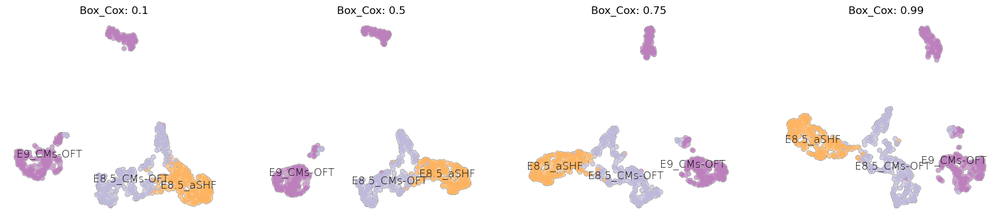

In [26]:
#Iterate over box_cox parameter, colored by cell type

def box_cox_test(ax, boxcox, rna, atac):
    
    mef2c_exp_model.get_umap_features(rna, box_cox=boxcox)
    mef2c_atac_model.get_umap_features(atac, box_cox=boxcox)

    rna, atac = mira.utils.make_joint_representation(rna, atac)

    sc.pp.neighbors(rna, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = 15)
    sc.tl.umap(rna, min_dist = 0.1)
    sc.pl.umap(rna, ax = ax, show = False, title = 'Box_Cox: ' + str(boxcox),
              color = 'Timepoint_x_Cell_Type', color_map = 'Set3', legend_loc='on data',
              add_outline=True, outline_width=(0.1,0), outline_color=('grey', 'white'),
              legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(1,4, figsize=(20,4))
for ax_i, boxcox in zip(ax, [0.1, 0.5, 0.75, 0.99]):
    box_cox_test(ax_i, boxcox, data_sub_RNA, data_sub_Peaks)

plt.show()

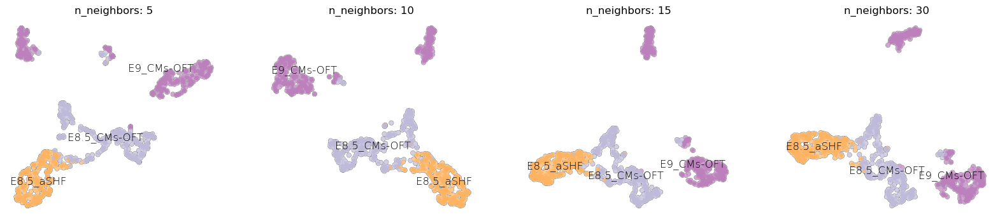

In [27]:
#Go with Box_Cox = 0.75
#Iterate over n_neighbors parameter, colored by cell type

def neighbors_test(ax, neighbors, rna, atac):

    mef2c_exp_model.get_umap_features(rna, box_cox=0.75)
    mef2c_atac_model.get_umap_features(atac, box_cox=0.75)
    
    rna, atac = mira.utils.make_joint_representation(rna, atac)

    sc.pp.neighbors(rna, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = neighbors)
    sc.tl.umap(rna, min_dist = 0.1)
    sc.pl.umap(rna, ax = ax, show = False, title = 'n_neighbors: ' + str(neighbors),
              color = 'Timepoint_x_Cell_Type', color_map = 'Set3', legend_loc='on data',
              add_outline=True, outline_width=(0.1,0), outline_color=('grey', 'white'),
              legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(1,4, figsize=(20,4))
for ax_i, neighbors in zip(ax, [5,10,15,30]):
    neighbors_test(ax_i, neighbors, data_sub_RNA, data_sub_Peaks)

plt.show()

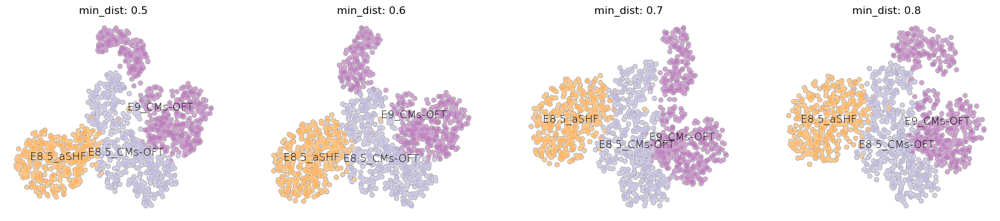

In [28]:
#Go with n_neighbors = 15
#Iterate over min_dist 
#Note: At this point, I also changed spread parameter from default of 1 to 0.3

def min_dist_test(ax, dist, rna, atac):

    mef2c_exp_model.get_umap_features(rna, box_cox=0.75)
    mef2c_atac_model.get_umap_features(atac, box_cox=0.75)
    
    rna, atac = mira.utils.make_joint_representation(rna, atac)

    sc.pp.neighbors(rna, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = 15)
    sc.tl.umap(rna, spread = 0.3, min_dist = dist, negative_sample_rate = 5)
    sc.pl.umap(rna, ax = ax, show = False, title = 'min_dist: ' + str(dist),
              color = 'Timepoint_x_Cell_Type', color_map = 'Set3', legend_loc='on data',
              add_outline=True, outline_width=(0.1,0), outline_color=('grey', 'white'),
              legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(1,4, figsize=(20,4))
for ax_i, dist in zip(ax, [0.5, 0.6, 0.7, 0.8]):
    min_dist_test(ax_i, dist, data_sub_RNA, data_sub_Peaks)

plt.show()

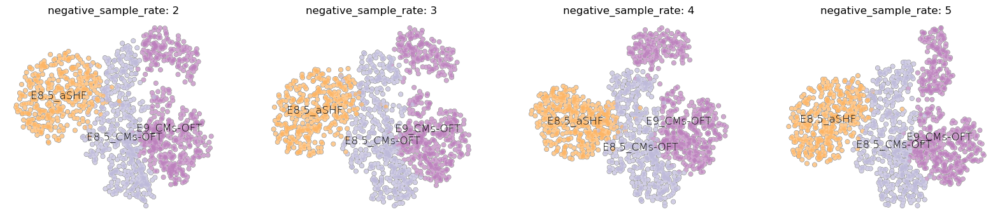

In [30]:
#Go with spread = 0.3 and min_dist = 0.7
#Iterate over negative_sample_rate

def neg_test(ax, neg_rate, rna, atac):
    
    mef2c_exp_model.get_umap_features(rna, box_cox=0.75)
    mef2c_atac_model.get_umap_features(atac, box_cox=0.75)

    rna, atac = mira.utils.make_joint_representation(rna, atac)

    sc.pp.neighbors(rna, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = 15)
    sc.tl.umap(rna, spread = 0.3, min_dist = 0.7, negative_sample_rate = neg_rate)
    sc.pl.umap(rna, ax = ax, show = False, title = 'negative_sample_rate: ' + str(neg_rate),
              color = 'Timepoint_x_Cell_Type', color_map = 'Set3', legend_loc='on data',
              add_outline=True, outline_width=(0.1,0), outline_color=('grey', 'white'),
              legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(1,4, figsize=(20,4))
for ax_i, neg_rate in zip(ax, [2, 3, 4, 5]):
    neg_test(ax_i, neg_rate, data_sub_RNA, data_sub_Peaks)

plt.show()

In [ ]:
#Make finalized UMAP

mef2c_exp_model.get_umap_features(data_sub_RNA, box_cox=0.75)
mef2c_atac_model.get_umap_features(data_sub_Peaks, box_cox=0.75)

data_sub_RNA, data_sub_Peaks = mira.utils.make_joint_representation(
    data_sub_RNA, data_sub_Peaks)

sc.pp.neighbors(data_sub_RNA, use_rep = 'X_joint_umap_features', metric = 'manhattan', n_neighbors = 15)
sc.tl.umap(data_sub_RNA, spread = 0.3, min_dist = 0.7, negative_sample_rate = 2)

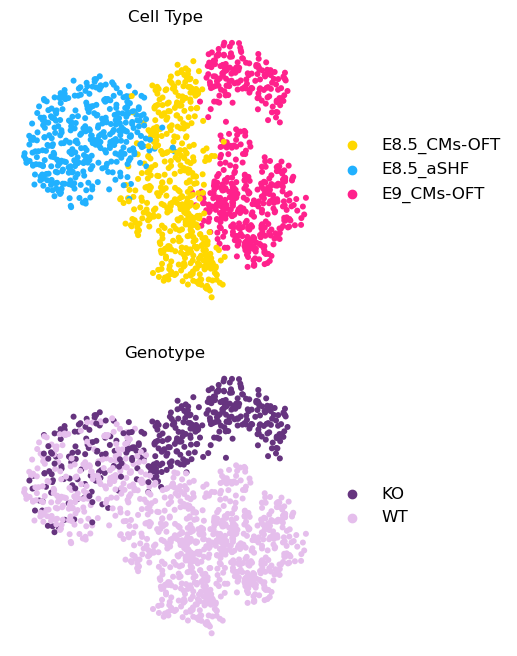

In [4]:
#Display UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = display_titles[display], size = 75,
              color = display_strings[display], palette = colormaps[display], legend_loc='right margin',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(2,1, figsize=(4,8))
display_strings = ['Timepoint_x_Cell_Type', 'Genotype']
display_titles = ['Cell Type', 'Genotype']
celltype_colors = ['#ffd800','#21b1ff','#ff218c']
genotype_colors = ['#66347F', '#E5BEEC']
colormaps = [celltype_colors, genotype_colors]
for ax_i, display in zip(ax, [0, 1]):
    display_fun(ax_i, display, data_sub_RNA)

plt.savefig('plots/Mef2c_CM_OFT_UMAPs_celltype_genotype.pdf')
plt.show()

In [8]:
#First, calculate the diffusion map,
#then use mira.time.normalize_diffmap to rescale the components of the diffusion map
#This regularizes distortions in magnitude of the eigenvectors.

sc.tl.diffmap(data_sub_RNA)
mira.time.normalize_diffmap(data_sub_RNA)

INFO:root:Added key to obsm: X_diffmap, normalized diffmap with 14 components.
INFO:root:Added key to uns: eigen_gap


Recommending 11 diffusion map components.


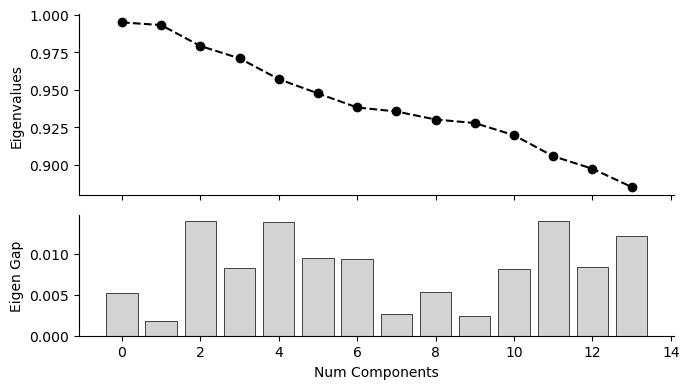

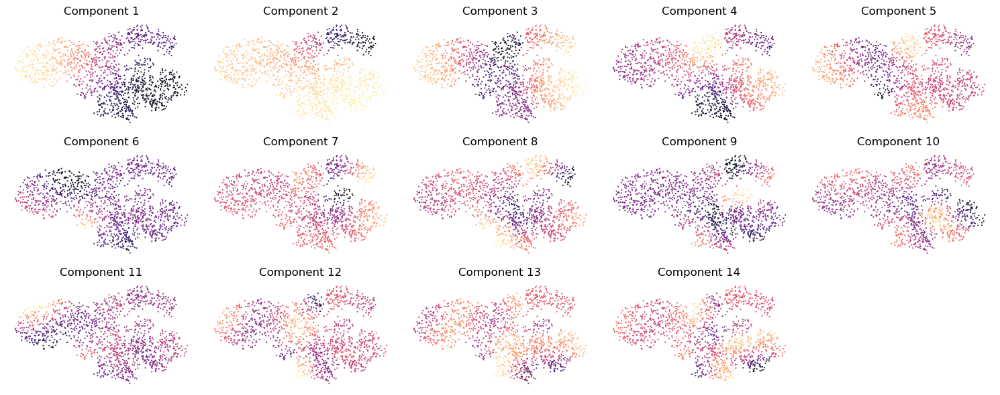

In [9]:
#Plot the Eigen_gap heuristic to ensure we select an appropriate number of components

mira.pl.plot_eigengap(data_sub_RNA, palette='magma')
plt.show()

In [10]:
#Next, we must define a new nearest-neighbors graph based on the diffusion components. 
#For sc.pp.neighbors, we indicate that we wish to calculate a new KNN graph using the first 
#__ components from data.obsm["X_diffmap"].

data_sub_RNA.obsm['X_diffmap'] = data_sub_RNA.obsm['X_diffmap'][:,:3] # subset the number of dimensions
sc.pp.neighbors(data_sub_RNA, use_rep='X_diffmap', key_added='X_diffmap')

In [11]:
#Now we check to make sure there are no disconnected components

mira.time.get_connected_components(data_sub_RNA)

INFO:mira.pseudotime.pseudotime:Found 1 components of KNN graph.


In [17]:
#In order to create a pseudotime trajectory, we need to select a starting cell. For now, I will randomly 
#pick a random WT E8.5 aSHF cell 

cell_indices = data_sub_RNA.obs.index[
                    (data_sub_RNA.obs['Timepoint_x_Cell_Type'] == 'E8.5_aSHF') &
                    (data_sub_RNA.obs['Genotype'] == 'WT')
                ]

print(random.choice(cell_indices))

sample23_CGTTAACAGCGATACT-1


In [12]:
###ONCE THIS IS WORKING WELL - DO NOT CHANGE THIS STARTING CELL

#Now, we can assign cells a pseudotime and define a transport map describing a markov chain model 
#of forward differentiation using mira.time.get_transport_map

initial_cell = 'sample23_CGTTAACAGCGATACT-1'
mira.time.get_transport_map(data_sub_RNA, start_cell= initial_cell)
###ONCE THIS IS WORKING WELL - DO NOT CHANGE THIS STARTING CELL

INFO:mira.pseudotime.pseudotime:Calculating inter-cell distances ...
INFO:root:Using 1 core. Speed this up by allocating more n_jobs.


Calculating pseudotime:   0%|          | 0/32900 [00:00<?, ?it/s]

INFO:mira.pseudotime.pseudotime:Calculating transport map ...
INFO:mira.adata_interface.pseudotime:Added key to obs: mira_pseudotime
INFO:mira.adata_interface.pseudotime:Added key to obsp: transport_map
INFO:mira.adata_interface.pseudotime:Added key to uns: start_cell


... storing 'mira_connected_components' as categorical


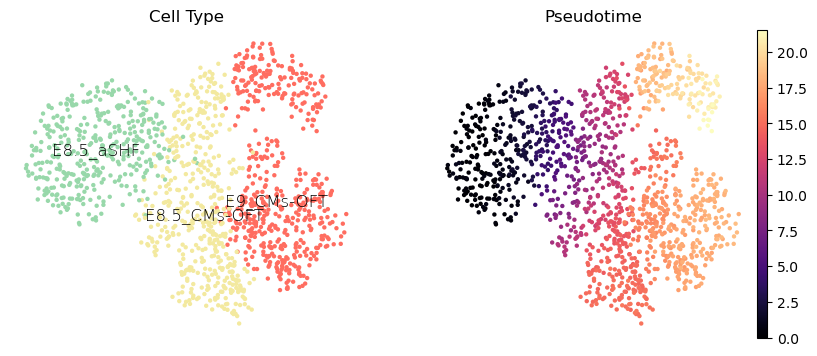

In [13]:
#Display pseudotime UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = display_titles[display], size = 40,
              color = display_strings[display], color_map = color_maps[display], legend_loc='on data',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)

fig, ax = plt.subplots(1,2, figsize=(10,4))
display_strings = ['Timepoint_x_Cell_Type', 'mira_pseudotime']
display_titles = ['Cell Type', 'Pseudotime']
color_maps = ['Set3', 'magma']
for ax_i, display in zip(ax, [0, 1]):
    display_fun(ax_i, display, data_sub_RNA)

plt.show()

INFO:mira.pseudotime.pseudotime:Found 2 terminal states from stationary distribution.


Terminal cells:  sample06_AACAGATAGTGAGGGT-1, sample05_TGCTTGCTCGCTAGTG-1


<AxesSubplot:title={'center':'Terminal Cells'}, xlabel='UMAP1', ylabel='UMAP2'>

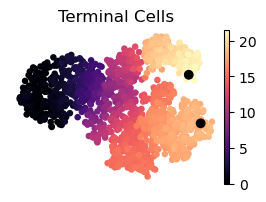

In [14]:
#Find terminal cells - "unbiased" MIRA method

#Default iterations and threshold parameters, for more terminal cells, increase number of iterations or threshold 
terminal_cells = mira.time.find_terminal_cells(data_sub_RNA, seed = 2, max_termini=2, iterations =1, threshold=1e-3)
print('Terminal cells: ', ', '.join(terminal_cells))

fig, ax = plt.subplots(1,1,figsize=(3,2))
sc.pl.umap(data_sub_RNA, color = 'mira_pseudotime', show = False,
           **umap_kwargs, color_map = 'magma', ax = ax)
sc.pl.umap(data_sub_RNA[terminal_cells], na_color = 'black', ax = ax,
          size = 200, title = 'Terminal Cells', show=False)

In [15]:
#Name terminal cells for states
terminal_cells_named = {
    'WT E9_CMs-OFT': 'sample05_TGCTTGCTCGCTAGTG-1',
    'KO E9_CMs-OFT': 'sample06_AACAGATAGTGAGGGT-1'
}

### Optional - If you want to define terminal cells manually:

In [ ]:
#Define terminal cells - manually

cell_types = ['E9_CMs-OFT']

genotypes = ['WT', 'KO']

terminal_cells_man = []
terminal_cells_man_named = {}

for n in range(len(cell_types)*len(genotypes)):
    name = genotypes[n//1] + ' ' + cell_types[n % 1]
    cells = data_sub_RNA.obs.index[
                    (data_sub_RNA.obs['Timepoint_x_Cell_Type'] == cell_types[n % 1]) &
                    (data_sub_RNA.obs['Genotype'] == genotypes[n//1])
                ]
    term_cell = random.choice(cells)
    terminal_cells_man.append(term_cell)
    terminal_cells_man_named[name] = term_cell

print(terminal_cells_man)
print(terminal_cells_man_named)

In [ ]:
#Show manually selected terminal cells and initial cell on UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = '', size = 40,
              color = display_strings[display], color_map = color_maps[display], legend_loc='on data',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)
    sc.pl.umap(data_sub_RNA[terminal_cells_man], na_color = 'black', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    sc.pl.umap(data_sub_RNA[initial_cell], na_color = 'black', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    fig = plt.gcf()
    title = fig.suptitle("Random Manual Terminal Cells", fontsize=12)

fig, ax = plt.subplots(1,2, figsize=(10,4))
display_strings = ['Timepoint_x_Cell_Type', 'mira_pseudotime']
color_maps = ['Set3', 'magma']

for ax_i, display in zip(ax, [0, 1]):
    display_fun(ax_i, display, data_sub_RNA)

plt.show()

Randomly picking cells and displaying on UMAP until finding cells I like for each group. Looking for cells that are near "median" space of cluster and towards end of pseudotime for that cluster

In [ ]:
terminal_cells_man = [
    'sample08_GGTAACCGTTACTAGG-1',
    'sample07_AGGTCTTAGCTGTAAC-1'
]

terminal_cells_man_named = {
    'WT E9_CMs-OFT': 'sample08_GGTAACCGTTACTAGG-1',
    'KO E9_CMs-OFT': 'sample07_AGGTCTTAGCTGTAAC-1'
}

#Show manually selected terminal cells and inital cell on UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = '', size = 40,
              color = display_strings[display], color_map = color_maps[display], legend_loc='on data',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)
    sc.pl.umap(data_sub_RNA[terminal_cells_man], na_color = 'black', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    sc.pl.umap(data_sub_RNA[initial_cell], na_color = 'black', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    fig = plt.gcf()
    title = fig.suptitle("Manual Terminal Cells", fontsize=12)

fig, ax = plt.subplots(1,3, figsize=(12,3))
display_strings = ['Timepoint_x_Cell_Type', 'Genotype', 'mira_pseudotime']
color_maps = ['Set3', 'Set3', 'magma']

for ax_i, display in zip(ax, [0, 1, 2]):
    display_fun(ax_i, display, data_sub_RNA)

plt.show()

### Resume:

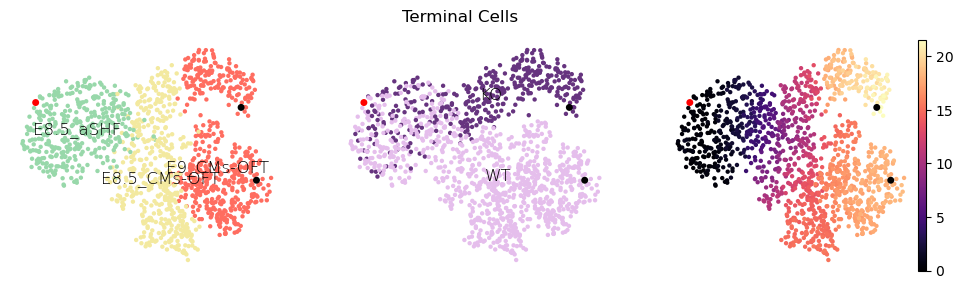

In [23]:
#Show terminal cells and inital cell on UMAP

def display_fun(ax, display, rna):
    sc.pl.umap(rna, ax = ax, show = False, title = '', size = 40,
              color = display_strings[display], color_map = color_maps[display], legend_loc='on data',
              add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)
    sc.pl.umap(data_sub_RNA[terminal_cells], na_color = 'black', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    sc.pl.umap(data_sub_RNA[initial_cell], na_color = 'red', legend_loc='on data',
          size = 100, title = '', show=False, ax = ax)
    fig = plt.gcf()
    title = fig.suptitle("Terminal Cells", fontsize=12)

fig, ax = plt.subplots(1,3, figsize=(12,3))
display_strings = ['Timepoint_x_Cell_Type', 'Genotype', 'mira_pseudotime']
color_maps = ['Set3', 'Set3', 'magma']

for ax_i, display in zip(ax, [0, 1, 2]):
    display_fun(ax_i, display, data_sub_RNA)

plt.show()

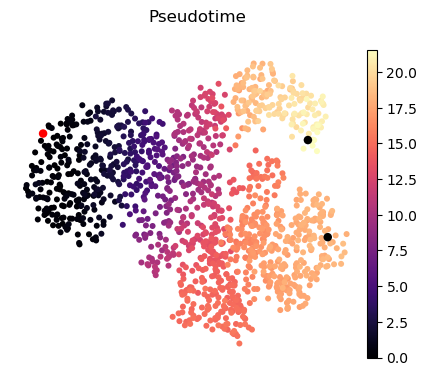

In [41]:
#Save pseudotime UMAP

fig, ax = plt.subplots(1,1, figsize=(5,4))
sc.pl.umap(data_sub_RNA, ax=ax, show = False, title = '', size = 75,
            color = 'mira_pseudotime', color_map = 'magma', legend_loc='right margin',
            add_outline=False, legend_fontweight=150, frameon = False, legend_fontsize=12)
sc.pl.umap(data_sub_RNA[terminal_cells], ax=ax, na_color = 'black', legend_loc=None,
            size = 150, title = '', show=False)
sc.pl.umap(data_sub_RNA[initial_cell], ax=ax, na_color = 'red', legend_loc=None,
            size = 150, title = '', show=False)

fig = plt.gcf()
title = fig.suptitle("Pseudotime", fontsize=12)

plt.savefig('plots/Mef2c_CM_OFT_UMAPs_pseudotime.pdf')
plt.show()

In [16]:
#Find probability of reaching each terminal state

mira.time.get_branch_probabilities(data_sub_RNA, terminal_cells = terminal_cells_named)

INFO:mira.pseudotime.pseudotime:Simulating random walks ...
INFO:mira.adata_interface.pseudotime:Added key to obsm: branch_probs
INFO:mira.adata_interface.pseudotime:Added key to uns: lineage_names


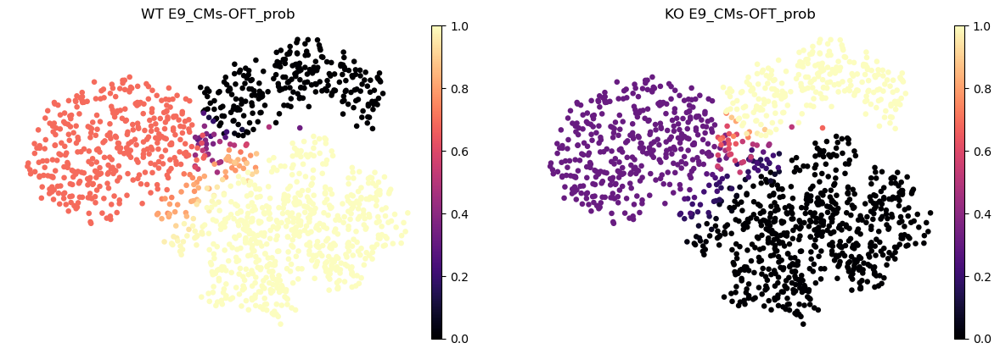

In [17]:
#Plot probabilites on UMAP

sc.pl.umap(data_sub_RNA,
   color = [x + '_prob' for x in data_sub_RNA.uns['lineage_names']],
   color_map='magma', **umap_kwargs)

INFO:mira.adata_interface.pseudotime:Added key to obs: tree_states
INFO:mira.adata_interface.pseudotime:Added key to uns: tree_state_names
INFO:mira.adata_interface.pseudotime:Added key to uns: connectivities_tree
... storing 'tree_states' as categorical


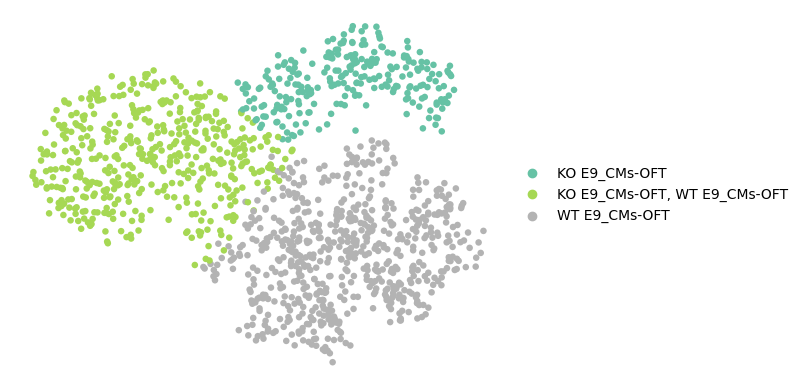

In [18]:
#Parse lineage probabilities to find bifurcating tree structure

mira.time.get_tree_structure(data_sub_RNA, threshold = 6)
sc.pl.umap(data_sub_RNA, color = 'tree_states', palette = 'Set2',
           **umap_kwargs, title = '', legend_loc='right margin')

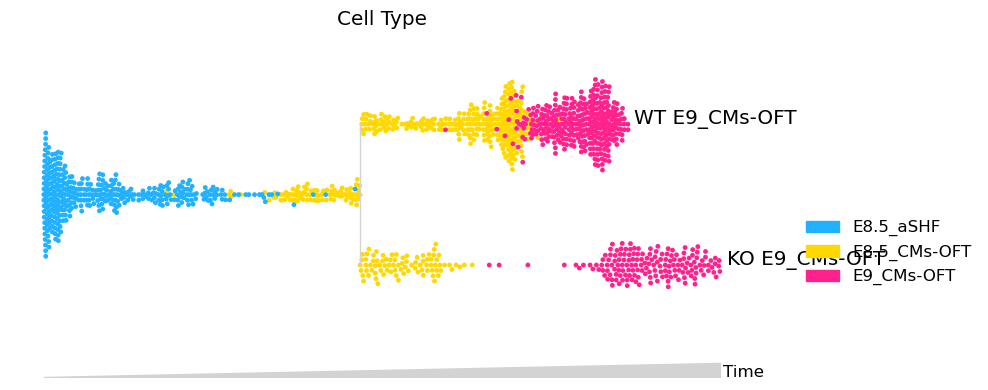

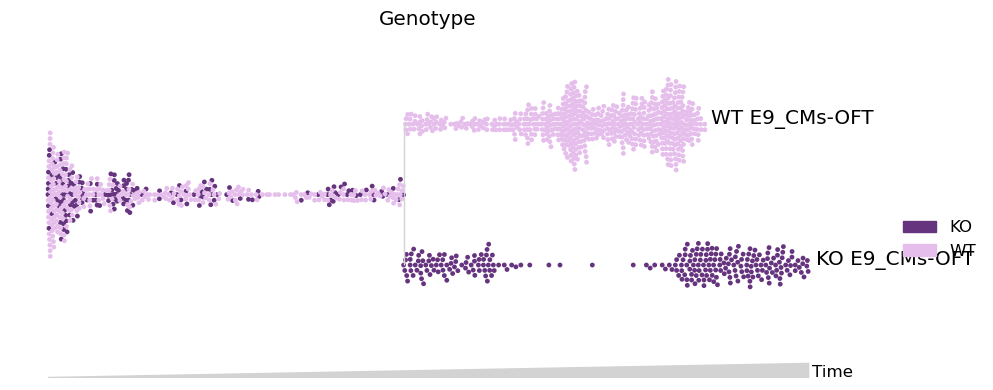

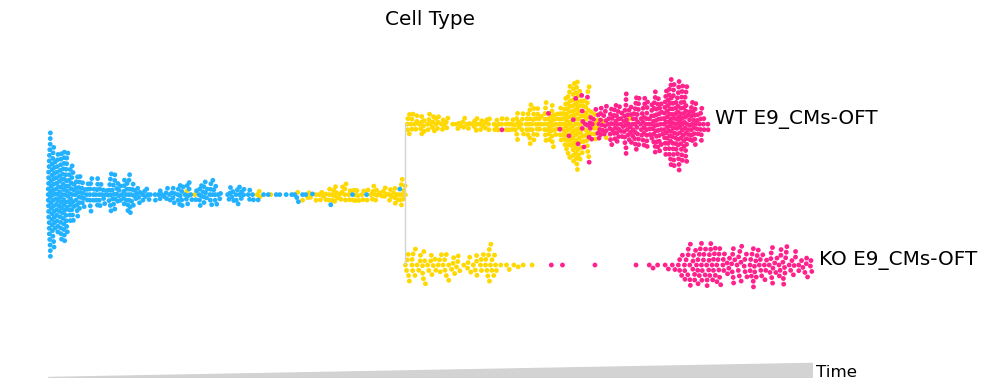

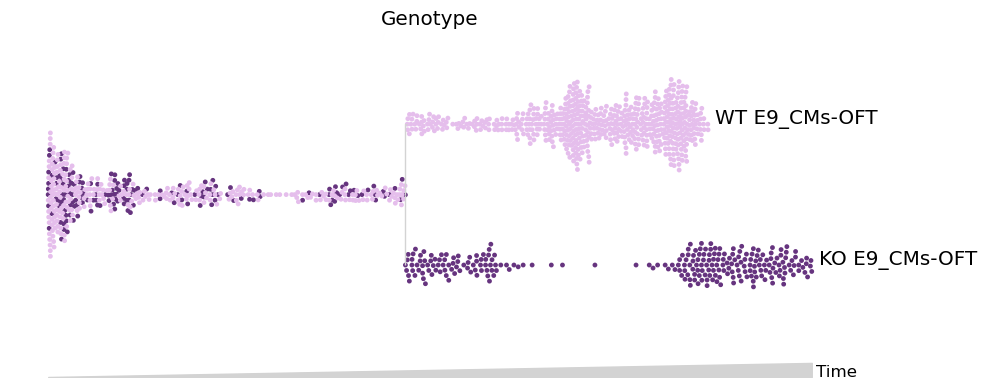

In [6]:
data_sub_RNA.obs.Timepoint_x_Cell_Type = data_sub_RNA.obs.Timepoint_x_Cell_Type.astype(str)
data_sub_RNA.obs.Genotype = data_sub_RNA.obs.Genotype.astype(str)

celltype_colors = ['#21b1ff','#ffd800','#ff218c']
genotype_colors = ['#66347F', '#E5BEEC']

def display_legends(display, data_obj):
    mira.pl.plot_stream(data_obj, 
                        data = display_strings[display], 
                        log_pseudotime=False, 
                        max_bar_height=0.99, 
                        title = display_titles[display],
                        style = 'swarm', 
                        palette = color_maps[display], 
                        size = 12, 
                        linewidth = 0,
                        figsize = (10,4),
                        max_swarm_density = 100,
                        show_legend = True,
                        legend_cols = 3)
    plt.savefig('plots/Mef2c_CM_OFT_streams_legends_' + display_save[display] + '.pdf')

def display_nolegends(display, data_obj):
    mira.pl.plot_stream(data_obj, 
                        data = display_strings[display], 
                        log_pseudotime=False, 
                        max_bar_height=0.99, 
                        title = display_titles[display],
                        style = 'swarm', 
                        palette = color_maps[display], 
                        size = 12, 
                        linewidth = 0,
                        figsize = (10,4),
                        max_swarm_density = 100,
                        show_legend = False)
    plt.savefig('plots/Mef2c_CM_OFT_streams_nolegends_' + display_save[display] + '.pdf')

display_strings = ['Timepoint_x_Cell_Type', 'Genotype']
display_titles = ['Cell Type', 'Genotype']
display_save = ['celltype', 'genotype']
color_maps = [celltype_colors, genotype_colors]

for display in [0, 1]:
    display_legends(display, data_sub_RNA)
    
for display in [0, 1]:
    display_nolegends(display, data_sub_RNA)

### Expression Topic Analysis 

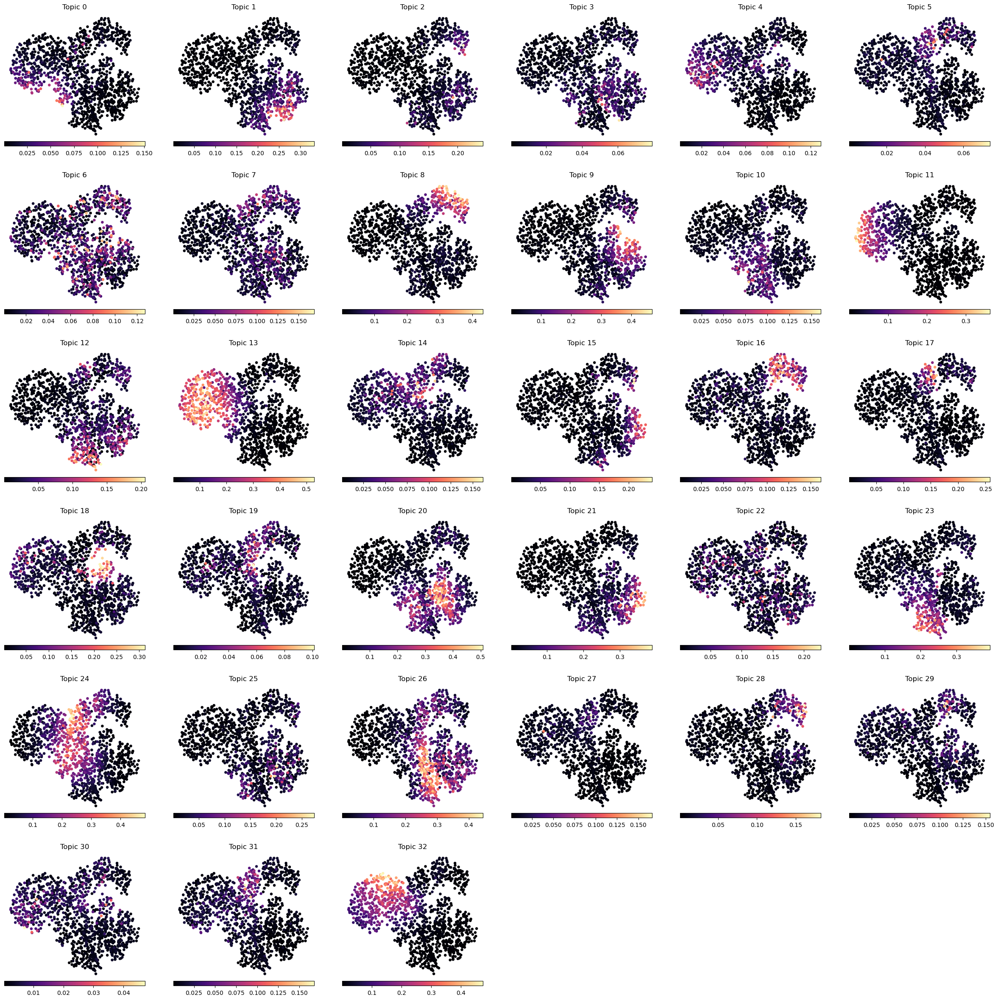

In [59]:
#Create a tiled UMAP montage to look at all expression topics 

#Plot titles
titles = [f"Topic {i}" for i in range(33)]

#And indexes for loop below
indexes = list(range(33))

def display_topics(ax, display, data):
    sc.pl.umap(data, ax = ax, show = False, title = '', colorbar_loc = 'bottom',
              color = f"topic_{display}", color_map = 'magma')
    ax.set_title(titles[display])

fig, ax = plt.subplots(6,6, figsize=(30,30))

for i, ax_i in enumerate(ax.flatten()):
    ax_i.axis('off')
    if i < len(indexes):
        display_topics(ax_i, indexes[i], data_sub_RNA)
        ax_i.set_title(titles[indexes[i]])

plt.show()

By inspecting these plots, we can see the following topics of interest:  

- E8.5 aSHF: Topics 11, 13*, 32
- E8.5 WT and KO OFT: Topic 24*
- E8.5 WT OFT: Topics 10, 12, 23, 26*
- E8.5 KO OFT: Topics 5, 17*, 31
- E9 WT OFT: Topics 1, 9, 20*, 21
- E9 KO OFT: Topics 8*, 16, 28

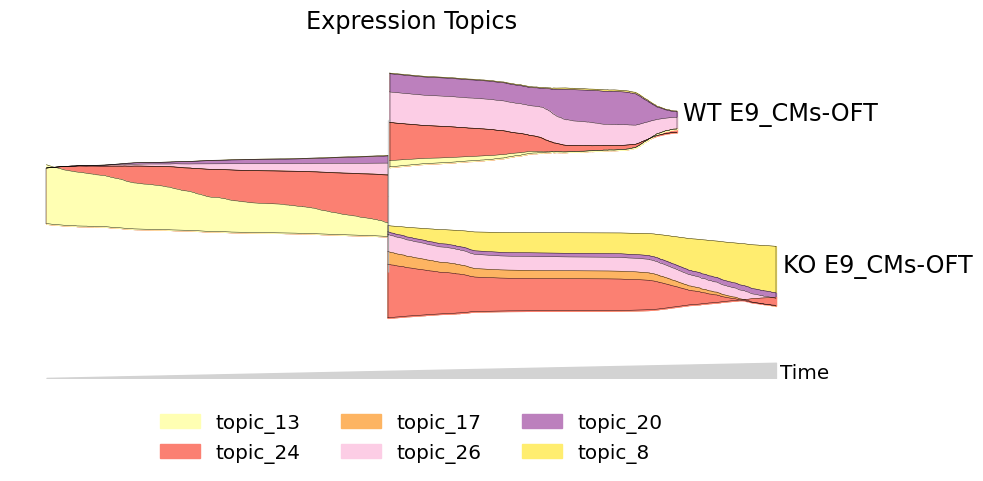

In [67]:
#Plot expression topics stream
plt.rcParams['font.size'] = 12
plot_kwargs = dict(hide_feature_threshold=0.03, linewidth=0.3, max_bar_height=0.8,
                    window_size=301, legend_cols=3, figsize = (10,5))

mira.pl.plot_stream(data_sub_RNA,
                    data = ['topic_' + str(i) for i in [8,13,17,20,24,26]],
                    title = 'Expression Topics',
                    order = 'ascending',
                    log_pseudotime=False, 
                    palette=sns.color_palette('Set3')[1::2], # warm tones
                    #palette = 'Set3',
                    **plot_kwargs)

plt.savefig('plots/Mef2c_CM_OFT_streams_exp_topics.pdf')

plt.show()

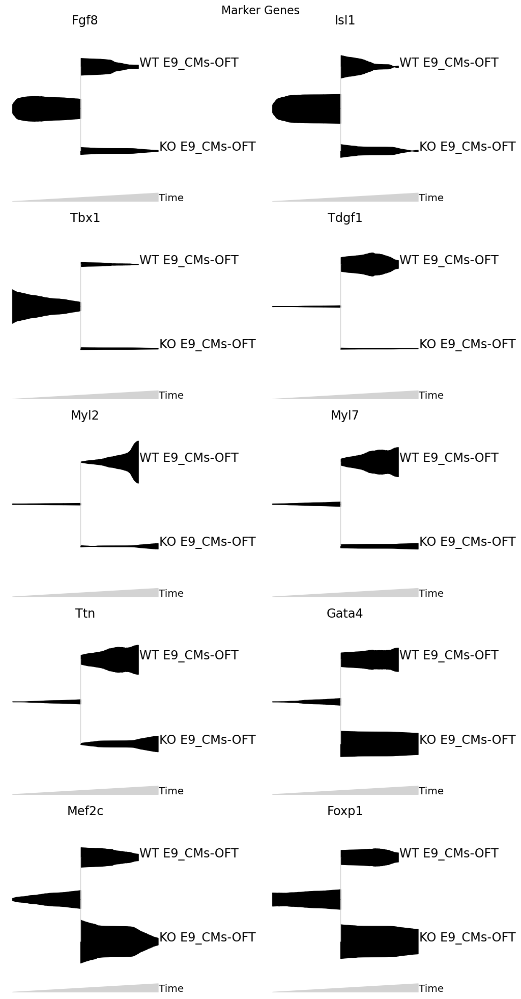

In [38]:
#Plot marker genes on the stream

#First, smooth the nomralized gene expression counts
data_sub_RNA.layers['smoothed'] = data_sub_RNA.obsp['connectivities'].dot(data_sub_RNA.layers['counts'])

#Stream plot
mira.pl.plot_stream(data_sub_RNA,
        data = ["Fgf8","Isl1", "Tbx1", "Tdgf1", "Myl2", "Myl7", "Ttn", "Gata4","Mef2c", "Foxp1"], # multiple genes
        layers = 'smoothed', # plot KNN-smoothed values
        style = "stream",
        split = True, # split features into separate plots
        color = "black",  # "color" overrides "palette" when there is just one feature
        clip = 3,
        scale_features=True,
        plots_per_row=2, # how many plots, per row
        log_pseudotime = False, window_size = 301,
        title  = 'Marker Genes')
plt.savefig('plots/Mef2c_CM_OFT_streams_marker_genes.pdf')
plt.show()

In [ ]:
#Get top genes from each topic
mef2c_exp_model.get_top_genes(8, top_n=50)

**Let's use Enrichr to examine functional enrichments for topics of interest
.post_topic sends the top genes to Enrichr**

**Note: A good rule of thumb for setting top_n genes is to take the top 5% of genes 
modeled by the expression topic model. 
In my case, I modeled ~4000 genes, so I post the top 200 genes.**

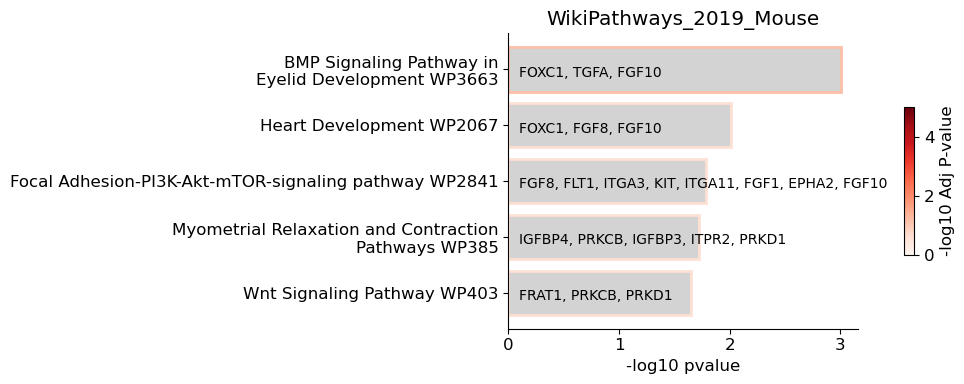

In [72]:
#Start with Topic 13: Enriched in E8.5 aSHF
mef2c_exp_model.post_topic(13, top_n=200)

#Download and visualize the enrichment results
#Options or ontologies can be found here: https://maayanlab.cloud/Enrichr/#libraries
mef2c_exp_model.fetch_topic_enrichments(13, ontologies= ['WikiPathways_2019_Mouse'])
mef2c_exp_model.plot_enrichments(13, show_top=5)

#plt.savefig('plots/Topic26_E9_CM_V_WT_enrich.pdf')

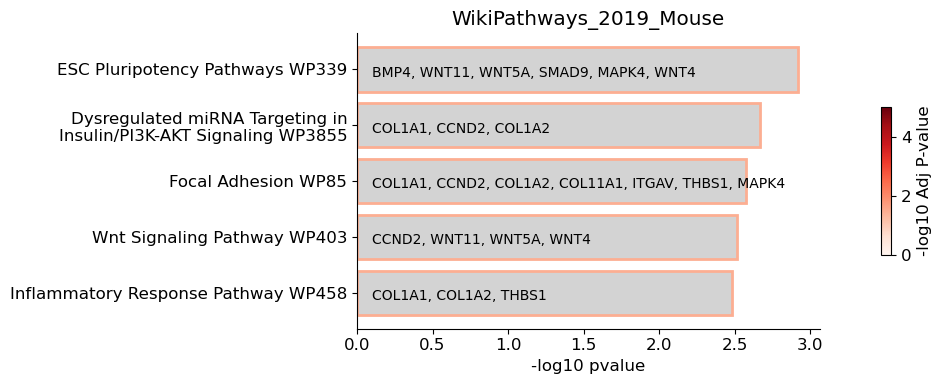

In [77]:
#Next Topic 26: Enriched in WT E8.5 OFT
mef2c_exp_model.post_topic(26, top_n=200)

#Download and visualize the enrichment results
#Options or ontologies can be found here: https://maayanlab.cloud/Enrichr/#libraries
mef2c_exp_model.fetch_topic_enrichments(26, ontologies= ['WikiPathways_2019_Mouse'])
mef2c_exp_model.plot_enrichments(26, show_top=5)

#plt.savefig('plots/Topic26_E9_CM_V_WT_enrich.pdf')

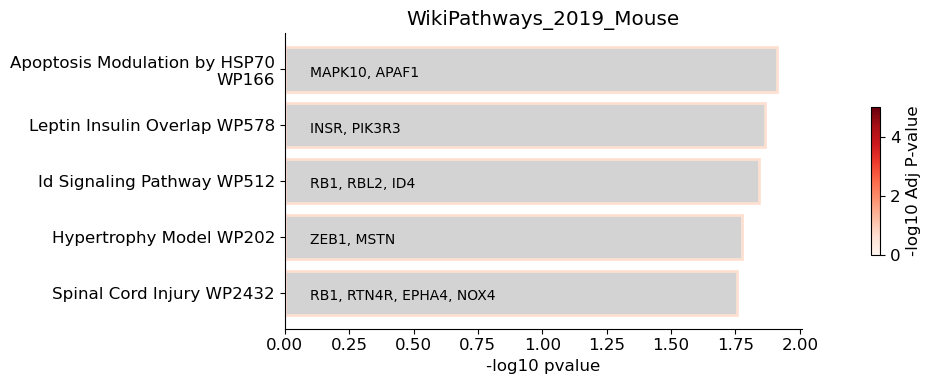

In [76]:
#Next Topic 17: Enriched in KO E8.5 OFT
mef2c_exp_model.post_topic(17, top_n=200)

#Download and visualize the enrichment results
#Options or ontologies can be found here: https://maayanlab.cloud/Enrichr/#libraries
mef2c_exp_model.fetch_topic_enrichments(17, ontologies= ['WikiPathways_2019_Mouse'])
mef2c_exp_model.plot_enrichments(17, show_top=5)

#plt.savefig('plots/Topic26_E9_CM_V_WT_enrich.pdf')

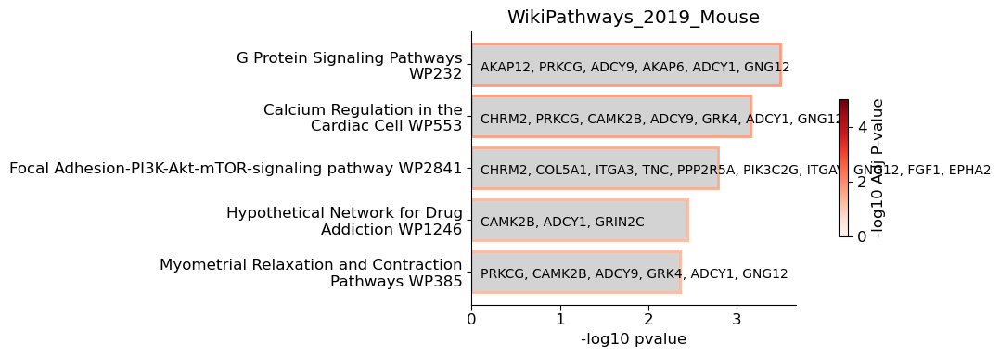

In [74]:
#Next Topic 20: Enriched in WT E9 OFT
mef2c_exp_model.post_topic(20, top_n=200)

#Download and visualize the enrichment results
#Options or ontologies can be found here: https://maayanlab.cloud/Enrichr/#libraries
mef2c_exp_model.fetch_topic_enrichments(20, ontologies= ['WikiPathways_2019_Mouse'])
mef2c_exp_model.plot_enrichments(20, show_top=5)

#plt.savefig('plots/Topic26_E9_CM_V_WT_enrich.pdf')

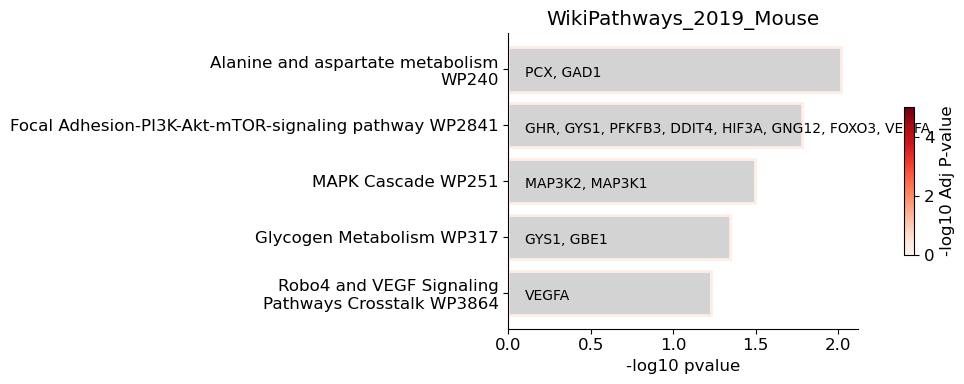

In [75]:
#Next Topic 8: Enriched in KO E9 OFT
mef2c_exp_model.post_topic(8, top_n=200)

#Download and visualize the enrichment results
#Options or ontologies can be found here: https://maayanlab.cloud/Enrichr/#libraries
mef2c_exp_model.fetch_topic_enrichments(8, ontologies= ['WikiPathways_2019_Mouse'])
mef2c_exp_model.plot_enrichments(8, show_top=5)

#plt.savefig('plots/Topic26_E9_CM_V_WT_enrich.pdf')

### Accessibility Topic Analysis 

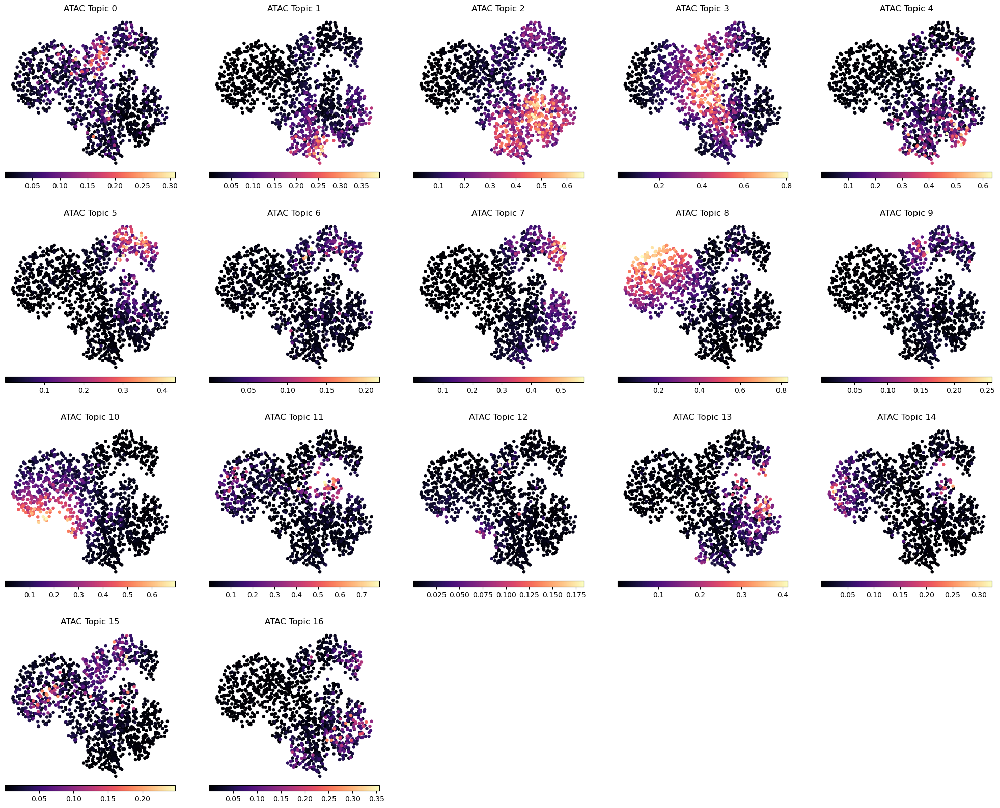

In [21]:
#Create a tiled UMAP montage to look at all accessibility topics 

#Plot titles
titles = [f"ATAC Topic {i}" for i in range(17)]

#And indexes for loop below
indexes = list(range(17))

def display_topics(ax, display, data):
    sc.pl.umap(data, ax = ax, show = False, title = '', colorbar_loc = 'bottom',
              color = f"ATAC_topic_{display}", color_map = 'magma')
    ax.set_title(titles[display])

fig, ax = plt.subplots(4,5, figsize=(25,20))

for i, ax_i in enumerate(ax.flatten()):
    ax_i.axis('off')
    if i < len(indexes):
        display_topics(ax_i, indexes[i], data_sub_RNA)
        ax_i.set_title(titles[indexes[i]])

plt.show()

By inspecting these plots, we can see the following topics of interest:  

- E8.5 aSHF: Topics 8*, 10
- E8.5 WT and KO OFT: Topic 3*
- E8.5 WT OFT: Topics 1*
- E8.5 KO OFT: Topics 0, 9
- E9 WT OFT: Topics 2*, 11, 13, 16
- E9 KO OFT: Topics 5*, 7*

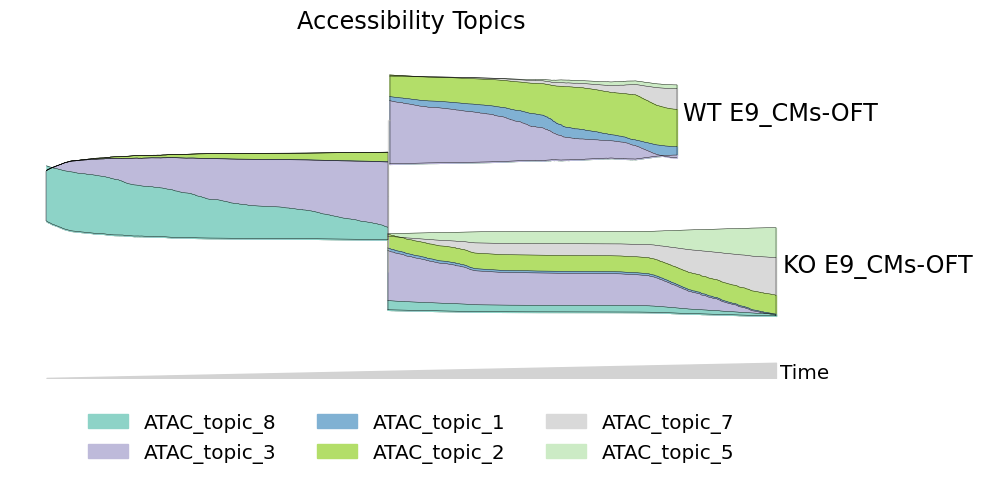

In [26]:
#Plot accessibility topics stream
plt.rcParams['font.size'] = 12
plot_kwargs = dict(hide_feature_threshold=0.03, linewidth=0.3, max_bar_height=0.8,
                    window_size=301, legend_cols=3, figsize = (10,5))

mira.pl.plot_stream(data_sub_RNA,
                    data = ['ATAC_topic_' + str(i) for i in [1,2,3,5,7,8]],
                    title = 'Accessibility Topics',
                    order = 'ascending',
                    log_pseudotime=False, 
                    palette=sns.color_palette('Set3')[::2], # cool tones
                    #palette = 'Set3',
                    **plot_kwargs)

plt.savefig('plots/Mef2c_CM_OFT_streams_atac_topics.pdf')

plt.show()

**Let's perform TF motif enrichment for our topics**

In [41]:
#Download mm10 genome fasta 
!mkdir -p genome_mm10
!wget https://hgdownload.soe.ucsc.edu/goldenPath/mm10/bigZips/mm10.fa.gz -O genome_mm10/mm10.fa.gz
!cd genome_mm10/ && gzip -d -f mm10.fa.gz

--2024-01-11 18:31:43--  https://hgdownload.soe.ucsc.edu/goldenPath/mm10/bigZips/mm10.fa.gz
Resolving prox1 (prox1)... 172.26.1.6
Connecting to prox1 (prox1)|172.26.1.6|:3128... connected.
Proxy request sent, awaiting response... 200 OK
Length: 870141360 (830M) [application/x-gzip]
Saving to: ‘genome_mm10/mm10.fa.gz’

genome_mm10/mm10.fa 100%[===================>] 829.83M   108MB/s    in 8.9s    

2024-01-11 18:31:52 (93.0 MB/s) - ‘genome_mm10/mm10.fa.gz’ saved [870141360/870141360]



In [83]:
#Convert format of peaks data from data_sub_Peaks.var -> need three separate columns for 'chr', 'start', and 'end'

#Copy the entire AnnData object to avoid messing up
peaks_cp = data_sub_Peaks.copy()

#Remove last row to remove F6eGFP peak so that you can run with standard mm10 genome annotation
peaks_cp = peaks_cp[:, :194046]

#Copy the .var feature (peak) data as a dataframe
var_df = peaks_cp.var.copy()

#Create new data frame with original data split into three columns for chr, start, and end
new_data = {
    'chr': var_df['idx'].str.split(':').str[0],
    'start': pd.to_numeric(var_df['idx'].str.split(':').str[1].str.split('-').str[0], errors='coerce'),
    'end': pd.to_numeric(var_df['idx'].str.split('-').str[1], errors='coerce'),
}
new_df = pd.DataFrame(new_data)

#Add new data frame to AnnData as .var
peaks_cp.var = new_df

# Rename the index to start from 1 and label it as 'peak_ids'
peaks_cp.var.index = range(1, len(peaks_cp.var) + 1)
peaks_cp.var.index.name = 'peak_id'

#Data format should now match tutorial data

In [84]:
#Using my data with standard MIRA function

#Now annotate motifs
mira.tools.motif_scan.logger.setLevel(logging.INFO) # make sure progress messages are displayed

#Need to make sure location of moods-dna.py is in path
#Found using 'which moods-dna.py' in command line
sys.path.append('/wynton/home/bruneau/jmuncie/.conda/envs/mira-env/bin')

mira.tl.get_motif_hits_in_peaks(peaks_cp,
                    genome_fasta='genome_mm10/mm10.fa',
                    chrom = 'chr', start = 'start', end = 'end',
                    pvalue_threshold=0.0001) # indicate chrom, start, end of peaks

INFO:mira.tools.motif_scan:Getting peak sequences ...
194046it [00:11, 16537.13it/s]
INFO:mira.tools.motif_scan:Scanning peaks for motif hits with p >= 0.0001 ...
INFO:mira.tools.motif_scan:Building motif background models ...
INFO:mira.tools.motif_scan:Starting scan ...
INFO:mira.tools.motif_scan:Found 1000000 motif hits ...
INFO:mira.tools.motif_scan:Found 2000000 motif hits ...
INFO:mira.tools.motif_scan:Found 3000000 motif hits ...
INFO:mira.tools.motif_scan:Found 4000000 motif hits ...
INFO:mira.tools.motif_scan:Found 5000000 motif hits ...
INFO:mira.tools.motif_scan:Found 6000000 motif hits ...
INFO:mira.tools.motif_scan:Found 7000000 motif hits ...
INFO:mira.tools.motif_scan:Found 8000000 motif hits ...
INFO:mira.tools.motif_scan:Found 9000000 motif hits ...
INFO:mira.tools.motif_scan:Found 10000000 motif hits ...
INFO:mira.tools.motif_scan:Found 11000000 motif hits ...
INFO:mira.tools.motif_scan:Found 12000000 motif hits ...
INFO:mira.tools.motif_scan:Found 13000000 motif hits 

Exception: Error while scanning for motifs: 

In [104]:
#Test
import os
import subprocess
import tempfile
import pyfaidx
import numpy as np
from scipy import sparse
import logging
from glob import glob
import tqdm
import re
import mira
from mira.adata_interface.core import wraps_functional
from mira.adata_interface.regulators import fetch_peaks, add_factor_hits_data
from functools import partial

logger = logging.getLogger(__name__)

mira_dir = os.path.dirname(mira.__file__)
PWM_DIR = os.path.join(mira_dir, 'package_data/motifs/')
PWM_suffix = 'jaspar'

def validate_peaks(peaks):

    assert(isinstance(peaks, (list, np.ndarray)))
    if isinstance(peaks, np.ndarray):
        assert(peaks.dtype in [np.str, 'S'])
        peaks = peaks.tolist()

    for peak in peaks:
        assert(isinstance(peak, (list,tuple)))
        assert(len(peak) == 3)

        try:
            int(peak[1])
            int(peak[2])
            str(peak[0])
        except ValueError:
            raise Exception('Count not coerce peak {} into (<str chrom>, <int start>, <int end>) format'.format(str(peak)))

    return peaks

'''def convert_jaspar_to_moods_pfm(jaspar_file):

    from Bio.motifs import read

    with open(jaspar_file, 'r') as f:
        motif = read(f, 'jaspar')

    if not motif.name is None and not motif.matrix_id is None:
        factor_name = motif.name.upper()
        motif_id = motif.matrix_id
    else:
        factor_name, motif_id = os.path.basename(jaspar_file).replace('.jaspar','').replace('/','-')\
            .upper().split('_')

    new_motif_filename = os.path.join(config.get('data','motifs'), '{}_{}.{}'.format(
            motif_id, factor_name.replace('(','.').replace(')', ''), config.get('jaspar','pfm_suffix')
        ).replace('/', '-'))

    with open(new_motif_filename, 'w') as f:
        for nuc in ['A','C','G','T']:
            print(*list(map(int, motif.counts[nuc])), sep = '\t', file = f)


def __download_jaspar_motifs__(write_dir):

    if not os.path.isdir(config.get('data','root')):
        os.mkdir(config.get('data','root'))

    r = requests.get(config.get('jaspar','motifs_url'))

    if r.ok:
        z = zipfile.ZipFile(io.BytesIO(r.content))
        z.extractall(write_dir)

        for jaspar_pfm in os.listdir(write_dir):
            convert_jaspar_to_moods_pfm(os.path.join(write_dir, jaspar_pfm))
        
    else:
        raise Exception('Error downloading motifs database from JASPAR')
        
def purge_motif_matrices():
    for matrix in list_motif_matrices():
        os.remove(matrix)'''

def get_motif_glob_str():
    return os.path.join(PWM_DIR, '*.{}'.format(PWM_suffix))

def list_motif_matrices():

    if not os.path.isdir(PWM_DIR):
        return []

    return list(glob(get_motif_glob_str()))


def list_motif_ids():
    return [os.path.basename(x).replace('.jaspar', '').split('_') for x in list_motif_matrices()]


def get_peak_sequences(peaks, genome, output_file):

    logger.info('Getting peak sequences ...')

    fa = pyfaidx.Fasta(genome)

    with open(output_file, 'w') as f:
        for i, (chrom,start,end) in tqdm.tqdm(enumerate(peaks)):
            
            try:
                peak_sequence = fa[chrom][int(start) : int(end)].seq
            except KeyError:
                peak_sequence = 'N'*(int(end) - int(start))

            print('>{idx}\n{sequence}'.format(
                    idx = str(i),
                    sequence = peak_sequence.upper()
                ), file = f, end=  '\n')


def get_motif_hits(peak_sequences_file, num_peaks, pvalue_threshold = 0.00005):

    logger.info('Scanning peaks for motif hits with p >= {} ...'.format(str(pvalue_threshold)))

    motifs_directory = PWM_DIR
    matrix_list = [
        os.path.basename(x) for x in
        glob(os.path.join(motifs_directory, '*.{}'.format(PWM_suffix)))
    ]

    command = ['moods-dna.py', 
        '-m', *matrix_list, 
        '-s', peak_sequences_file, 
        '-p', str(pvalue_threshold), 
        '--batch']

    logger.info('Building motif background models ...')
    process = subprocess.Popen(
        ' '.join(command), 
        stdout=subprocess.PIPE, 
        shell=True, 
        stderr=subprocess.PIPE, 
        cwd = motifs_directory
    )

    motif_matrices = matrix_list 
    motif_idx_map = dict(zip(motif_matrices, np.arange(len(motif_matrices))))

    motif_indices, peak_indices, scores = [],[],[]
    i=0
    while process.stdout.readable():
        line = process.stdout.readline()

        if not line:
            break
        else:
            if i == 0:
                logger.info('Starting scan ...')
            i+=1

            peak_num, motif, hit_pos, strand, score, site, snp = line.decode().strip().split(',')
            
            motif_indices.append(motif_idx_map[motif])
            peak_indices.append(peak_num)
            scores.append(float(score))

            if i%1000000 == 0:
                logger.info('Found {} motif hits ...'.format(str(i)))

    if not process.poll() == 0:
        raise Exception('Error while scanning for motifs: ' + process.stderr.read().decode())

    logger.info('Formatting hits matrix ...')
    return sparse.coo_matrix((scores, (peak_indices, motif_indices)), 
        shape = (num_peaks, len(motif_matrices))).tocsr().T.tocsr()


def _parse_motif_name(motif_name):
    return [x.upper() for x in re.split('[/::()-]', motif_name)][0]


@wraps_functional(fetch_peaks, partial(add_factor_hits_data, factor_type = 'motifs'), ['peaks'])
def get_motif_hits_in_peaks_JM(peaks, pvalue_threshold = 0.0001,*, genome_fasta):
    '''
    Scan peak sequences for motif hits given by JASPAR position frequency matrices
    using MOODS 3. Motifs are recorded as binary hits if the p-value exceeds a 
    given threshold.

    Parameters
    ----------
    adata : anndata.AnnData
        AnnData object of chromatin accessibility. Peak locations located in
        `.var` with columns corresponding to the chromosome, start, and end
        coordinates given by the `chrom`, `start` and `end` parameters, respectively. 
    genome_fasta : str
        String, file location of fasta file of your organisms genome.
    chrom : str, default = "chr"
        The column in `adata.var` corresponding to the chromosome of peaks
    start : str, defualt = "start"
        The column in `adata.var` corresponding to the start coordinate of peaks
    end : str, default = "end"
        The column in `adata.var` corresponding to the end coordinate of peaks
    pvalue_threshold : float > 0, defualt = 0.0001
        Adjusted p-value threshold for calling a motif hit within a peak.

    Returns
    -------

    adata : anndata.AnnData
        `.varm["motifs_hits"]` : scipy.spmatrix[float] of shape (n_motifs, n_peaks)
            Called motif hits for each peak. Each value is the affinity score of a motif
            for a sequence. Non-significant hits are left empty in the sparse matrix.
        `.uns['motifs']` : dict of type {str : list}
            Dictionary of metadata for motifs. Each key is an attribute. Attributes 
            recorded for each motif are the ID, name, parsed factor name (for lookup
            in expression data), and whether expression data exists for that factor. The
            columns are labeled id, name, parsed_name, and in_expr_data, respectively. 

    .. note::

        To retrieve the metadata for motifs, one may use the method `mira.utils.fetch_factor_meta(adata)`.
        
        Currently, MIRA ships with the 2021 JASPAR core vertebrates collection. In the
        future, this will be expanded to include options for updated JASPAR collections
        and user-provided PFMs.

    Examples
    --------

    .. code-block:: python

        >>> atac_data.var
        ...                 chr   start     end
        ...    chr1:9778-10670     chr1    9778   10670
        ...    chr1:180631-181281  chr1  180631  181281
        ...    chr1:183970-184795  chr1  183970  184795
        ...    chr1:190991-191935  chr1  190991  191935
        >>> mira.tl.get_motif_hits_in_peaks(atac_data, 
        ...    chrom = "chr", start = "start", end = "end",
        ...    genome_file = "~/genomes/hg38/hg38.fa"
        ... )

    '''

    peaks = validate_peaks(peaks)

    temp_fasta = tempfile.NamedTemporaryFile(delete = False)
    temp_fasta_name = temp_fasta.name
    temp_fasta.close()

    #Specify the file path
    file_path = "sample_output.txt"

    # Open the file for writing
    with open(file_path, 'w') as file:
        #Write each item in the list to a new line in the file
        for item in peaks:
            file.write(str(item) + '\n')
    
    try:

        get_peak_sequences(peaks, genome_fasta, temp_fasta_name)

        #print(type(peaks))
        #print(len(peaks))
        
        # Specify the file path
        #file_path = "output.txt"

        # Open the file for writing
        #with open(file_path, 'w') as file:
            # Write each item in the list to a new line in the file
            #for item in peaks:
                #file.write(str(item) + '\n')
        
        hits_matrix = get_motif_hits(temp_fasta_name, len(peaks), pvalue_threshold = pvalue_threshold)

        ids, factors = list(zip(*list_motif_ids()))
        parsed_factor_names = list(map(_parse_motif_name, factors))

        return ids, factors, parsed_factor_names, hits_matrix

    finally:
        os.remove(temp_fasta_name)

In [105]:
#Using tutorial data with function defined above for troubleshooting

#Now annotate motifs
mira.tools.motif_scan.logger.setLevel(logging.INFO) # make sure progress messages are displayed

#Need to make sure location of moods-dna.py is in path
#Found using 'which moods-dna.py' in command line
sys.path.append('/wynton/home/bruneau/jmuncie/.conda/envs/mira-env/bin')

get_motif_hits_in_peaks_JM(atac_data,
                    genome_fasta='genome_mm10/mm10.fa',
                    chrom = 'chr', start = 'start', end = 'end',
                    pvalue_threshold=0.0001) # indicate chrom, start, end of peaks

INFO:__main__:Getting peak sequences ...
334124it [04:52, 1141.07it/s]
INFO:__main__:Scanning peaks for motif hits with p >= 0.0001 ...
INFO:__main__:Building motif background models ...
INFO:__main__:Starting scan ...
INFO:__main__:Found 1000000 motif hits ...
INFO:__main__:Found 2000000 motif hits ...
INFO:__main__:Found 3000000 motif hits ...
INFO:__main__:Found 4000000 motif hits ...
INFO:__main__:Found 5000000 motif hits ...
INFO:__main__:Found 6000000 motif hits ...
INFO:__main__:Found 7000000 motif hits ...
INFO:__main__:Found 8000000 motif hits ...
INFO:__main__:Found 9000000 motif hits ...
INFO:__main__:Found 10000000 motif hits ...
INFO:__main__:Found 11000000 motif hits ...
INFO:__main__:Found 12000000 motif hits ...
INFO:__main__:Found 13000000 motif hits ...
INFO:__main__:Found 14000000 motif hits ...
INFO:__main__:Found 15000000 motif hits ...
INFO:__main__:Found 16000000 motif hits ...
INFO:__main__:Found 17000000 motif hits ...
INFO:__main__:Found 18000000 motif hits ..

Exception: Error while scanning for motifs: 

In [ ]:
#Try running outside of Wynton


In [118]:
# To access topic composition matrix
matrix = peaks_cp.varm['topic_feature_compositions']
matrix.shape

(194046, 17)

In [ ]:
#Get enriched TF motifs for topics of interest
#  Note: top_quantile controls what quantile of peaks are taken to represent the topic. 
#        Values between 0.1 and 0.2, so the top 10% to 20% peaks, work best.
mef2c_atac_model.get_enriched_TFs(peaks_cp, topic_num=2, top_quantile=0.2)
mef2c_atac_model.get_enriched_TFs(peaks_cp, topic_num=7, top_quantile=0.2)

#You can retrieve enrichment results using get_enrichments. Note, this list is not sorted:
mfs_topic_2 = pd.DataFrame(mef2c_atac_model.get_enrichments(2))
mfs_topic_2 = mfs_topic_2.sort_values(by='pval', ascending=True)
print(mfs_topic_2.head(20))
mfs_topic_7 = pd.DataFrame(mef2c_atac_model.get_enrichments(7))
mfs_topic_7 = mfs_topic_7.sort_values(by='pval', ascending=True)
print(mfs_topic_7.head(20))

In [41]:
#Save subset AnnData objects
data_sub_RNA.write_h5ad(filename="Lineage_AnnData/Mef2c_CM-OFT_RNA_AnnData.h5ad")
data_sub_Peaks.write_h5ad(filename="Lineage_AnnData/Mef2c_CM-OFT_Peaks_AnnData.h5ad")